# Importing Necessary Libraries

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np
import os
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from albumentations import HorizontalFlip, VerticalFlip, Rotate
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score

# Creating The U_Net Model

In [4]:
class DoubleConv(nn.Module):
    def __init__(self,in_channels,out_channels):
        super(DoubleConv,self).__init__()
        self.conv = nn.Sequential(
        nn.Conv2d(in_channels, out_channels,3,1,1,bias = False), #stride=1,padding=1, so output size will be same as input , only number of channels will differ
        nn.BatchNorm2d(out_channels),
        nn.ReLU(),
        nn.Conv2d(out_channels, out_channels,3,1,1,bias = False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(),
        )
    def forward(self,x):
        return self.conv(x)
    
class encoder_block(nn.Module):
    def __init__(self,in_channels,out_channels):
        super(encoder_block,self).__init__()
        self.c = DoubleConv(in_channels,out_channels)
        self.p = nn.MaxPool2d(kernel_size=2,stride=2)  # halves the spatial dimension both in height and width

    def forward(self,x):
        x = self.c(x)
        return x,self.p(x)  #we need x for the skip connections
    
class decoder_block(nn.Module):
    def __init__(self,in_channels,out_channels):
        super(decoder_block,self).__init__()
        self.up = nn.ConvTranspose2d(in_channels,out_channels,kernel_size=2,stride=2,padding=0)
        self.dc = DoubleConv(out_channels+out_channels,out_channels)
        
    def forward(self,x,skip):
        x = self.up(x)
        x = torch.cat([x,skip],dim=1)
        x = self.dc(x)
        return x
    
class U_Net(nn.Module):
    def __init__(self):
        super(U_Net,self).__init__()
        
        #Encoder
        self.e1 = encoder_block(3,64)
        self.e2 = encoder_block(64,128)
        self.e3 = encoder_block(128,256)
        self.e4 = encoder_block(256,512)
        
        #Bottleneck
        self.b = DoubleConv(512,1024)
        
        #Decoder
        self.d1 = decoder_block(1024,512)
        self.d2 = decoder_block(512,256)
        self.d3 = decoder_block(256,128)
        self.d4 = decoder_block(128,64)
        
        #Pixel Classifier
        self.classifier = nn.Conv2d(64,1,kernel_size=1)
        
    def forward(self,input):
        #Encoder
        s1,x = self.e1(input)
        s2,x = self.e2(x)
        s3,x = self.e3(x)
        s4,x = self.e4(x)
        
        #Bottleneck
        b = self.b(x)
        
        #Decoder
        output = self.d1(b,s4)
        output = self.d2(output,s3)
        output = self.d3(output,s2)
        output = self.d4(output,s1)
        
        #Pixel classifier
        output = self.classifier(output)
        return output
    
if __name__ == "__main__":
    x = torch.randn((2, 3, 512, 512))
    f = U_Net()
    y = f(x)
    print(y.shape)

torch.Size([2, 1, 512, 512])


# Loss Function

In [5]:
class DiceBCELoss(nn.Module):
    def __init__(self):
        super(DiceBCELoss,self).__init__()
    
    def forward(self,inputs,targets,smooth=1):  #smooth is for avoiding division by zero error
        outputs = torch.sigmoid(inputs)
        
        #flatten the outputs and targets tensors
        outputs = outputs.view(-1)
        targets = targets.view(-1)
        
        #calculating the dice loss
        intersection = (outputs*targets).sum()
        dice_loss = 1-(2.*intersection+smooth)/(outputs.sum()+targets.sum()+smooth) #. is for floating point opearation
        
        #calculating BCE loss
        BCE = F.binary_cross_entropy(outputs,targets,reduction='mean')
        
        Dice_BCE = BCE + dice_loss
        return Dice_BCE
        

# Loading The Dataset

In [6]:
def load_data(folder_path):
    files = []
    # Iterate through files in the folder
    for filename in sorted(os.listdir(folder_path)):
        file_path = os.path.join(folder_path, filename)
        # Open the file
        with Image.open(file_path) as img:
            # Convert img to NumPy array
            data = np.array(img)
            # Append the NumPy array to the list
            files.append(data)
    return np.array(files)


train_img , train_mask = load_data('/kaggle/input/drive2004/DRIVE/training/images'), load_data('/kaggle/input/drive2004/DRIVE/training/1st_manual')
test_img, test_mask = load_data('/kaggle/input/drive2004/DRIVE/test/images'), load_data('/kaggle/input/drive2004/DRIVE/test/1st_manual')
print('Train images shape:{}'.format(train_img.shape))
print('Train masks shape:{}'.format(train_mask.shape))
print('Test images shape:{}'.format(test_img.shape))
print('Test masks shape:{}'.format(test_mask.shape))

Train images shape:(20, 584, 565, 3)
Train masks shape:(20, 584, 565)
Test images shape:(20, 584, 565, 3)
Test masks shape:(20, 584, 565)


# Visualizing The Dataset

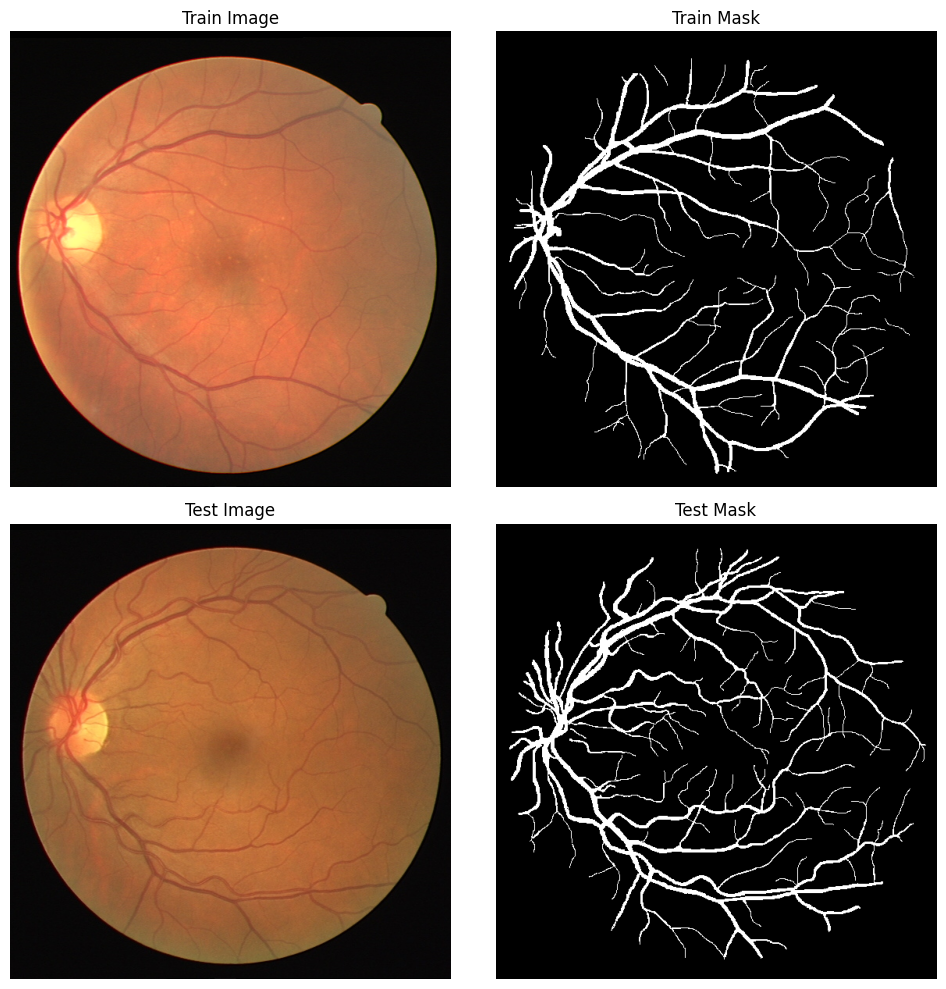

In [7]:
# Visualize the first element from each array
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Train images
axes[0, 0].imshow(train_img[0])
axes[0, 0].set_title('Train Image')
axes[0, 0].axis('off')

# Train masks
axes[0, 1].imshow(train_mask[0], cmap='gray')
axes[0, 1].set_title('Train Mask')
axes[0, 1].axis('off')

# Test images
axes[1, 0].imshow(test_img[0])
axes[1, 0].set_title('Test Image')
axes[1, 0].axis('off')

# Test masks
axes[1, 1].imshow(test_mask[0], cmap='gray')
axes[1, 1].set_title('Test Mask')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# Performing Data Augmentation on Training Images and Masks

In [8]:
# Define augmentation transforms
transforms = [
    HorizontalFlip(p=1),
    VerticalFlip(p=1),
    Rotate(limit=45, p=1) #Each transformation has a probability p set to 1, meaning they will be applied with certainty.
    #limit: This parameter defines the maximum angle range for rotation. In this case, limit=45 means that the rotation angle will be randomly chosen from the range [-45, 45] degrees. So, each image will be rotated by a random angle within this range.
]

# Function to perform augmentation on a single image and mask
def augment_image_and_mask(image, mask, transforms):
    augmented_images = [image]
    augmented_masks = [mask]

    for transform in transforms:
        augmented = transform(image=image, mask=mask)
        augmented_images.append(augmented["image"])
        augmented_masks.append(augmented["mask"])

    return augmented_images, augmented_masks

# Assuming train_images, train_masks, test_images, test_masks are your numpy arrays
train_augmented_images = []
train_augmented_masks = []
test_augmented_images = []
test_augmented_masks = []

# Augment train images and masks
for i in range(len(train_img)):
    augmented_images, augmented_masks = augment_image_and_mask(train_img[i], train_mask[i], transforms)
    
    train_augmented_images.extend(augmented_images)
    train_augmented_masks.extend(augmented_masks)
    
final_train_images = np.array(train_augmented_images)
final_train_masks = np.array(train_augmented_masks)

# Verify shapes
print("Final train images shape:", final_train_images.shape)
print("Final train masks shape:", final_train_masks.shape)

Final train images shape: (80, 584, 565, 3)
Final train masks shape: (80, 584, 565)


# Visualizing Augmented Data

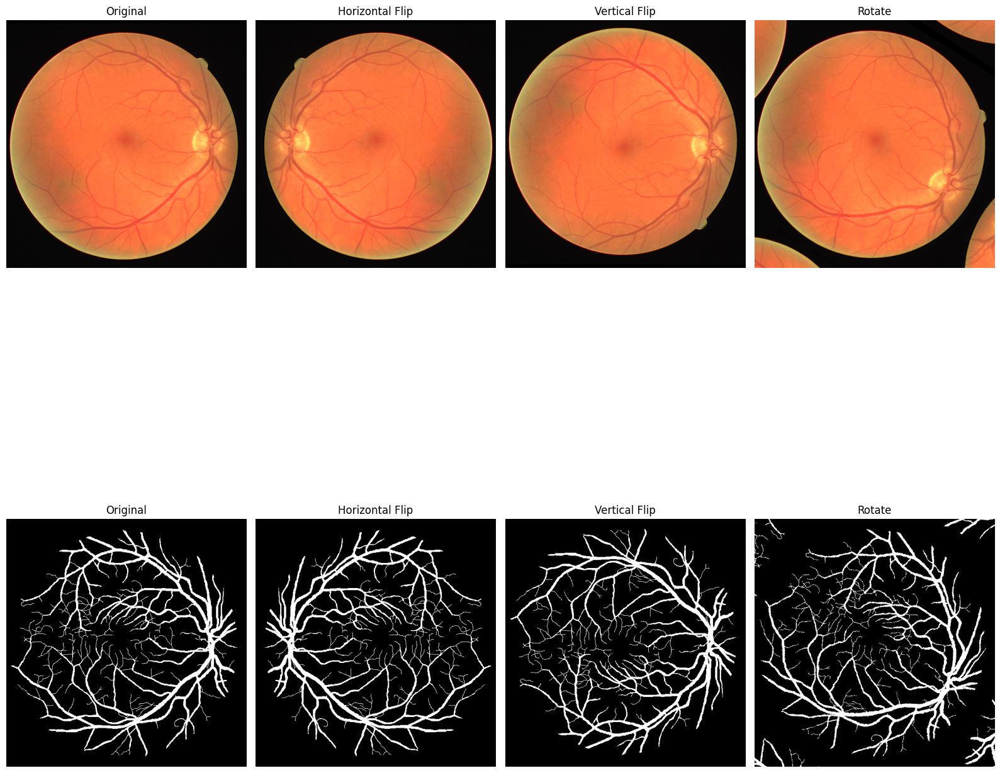

In [9]:
# Reshape the data to get 20 groups of 4 consecutive arrays
train_images_chunks = np.reshape(final_train_images, (20, 4, 584, 565, 3))
train_masks_chunks = np.reshape(final_train_masks, (20, 4, 584, 565))

# Set a fixed random seed for reproducibility
np.random.seed(44)

# Randomly pick any of the 20 chunks
chunk_index = np.random.randint(0, 20)

# Select the chunk of images and masks
chunk_images = train_images_chunks[chunk_index]
chunk_masks = train_masks_chunks[chunk_index]

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 20))

axes[0,0].imshow(chunk_images[0])
axes[0,0].set_title('Original')
axes[0,0].axis('off')
axes[0,1].imshow(chunk_images[1])
axes[0,1].set_title('Horizontal Flip')
axes[0,1].axis('off')
axes[0,2].imshow(chunk_images[2])
axes[0,2].set_title('Vertical Flip')
axes[0,2].axis('off')
axes[0,3].imshow(chunk_images[3])
axes[0,3].set_title('Rotate')
axes[0,3].axis('off')

axes[1,0].imshow(chunk_masks[0],cmap = 'gray')
axes[1,0].set_title('Original')
axes[1,0].axis('off')
axes[1,1].imshow(chunk_masks[1],cmap = 'gray')
axes[1,1].set_title('Horizontal Flip')
axes[1,1].axis('off')
axes[1,2].imshow(chunk_masks[2],cmap = 'gray')
axes[1,2].set_title('Vertical Flip')
axes[1,2].axis('off')
axes[1,3].imshow(chunk_masks[3],cmap = 'gray')
axes[1,3].set_title('Rotate')
axes[1,3].axis('off')

plt.tight_layout()
plt.show()

# Train Validation Split

In [10]:
# Set a random seed for reproducibility
seed = 42
np.random.seed(seed)

# Shuffle indices
indices = np.arange(len(final_train_images))
np.random.shuffle(indices)

# Use 80% of the data for training and 20% for validation
split = int(0.8 * len(final_train_images))
train_indices, val_indices = indices[:split], indices[split:]

# Split images and masks into train and validation sets
train_images, train_masks = final_train_images[train_indices], final_train_masks[train_indices]
val_images, val_masks = final_train_images[val_indices], final_train_masks[val_indices]

print("Train images shape:", train_images.shape)
print("Train masks shape:", train_masks.shape)
print("Validation images shape:", val_images.shape)
print("Validation masks shape:", val_masks.shape)

Train images shape: (64, 584, 565, 3)
Train masks shape: (64, 584, 565)
Validation images shape: (16, 584, 565, 3)
Validation masks shape: (16, 584, 565)


# Preparing the Dataset for Training

In [11]:
class CustomDataset(Dataset):
    def __init__(self, images, masks):
        self.images = images
        self.masks = masks
        self.n_samples = len(images)

    def __getitem__(self, index):
        image = self.images[index]
        mask = self.masks[index]

        # Resize image to 512x512
        image = cv2.resize(image, (512, 512))
        mask = cv2.resize(mask, (512, 512))

        # Reshape image to (C, H, W) format and normalize
        image = image.transpose((2, 0, 1)).astype(np.float32) / 255.0
        # Normalize mask to range [0, 1]
        mask = mask / 255.0

        # Convert to PyTorch tensors
        image = torch.tensor(image, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)  # Add channel dimension

        return image, mask

    def __len__(self):
        return self.n_samples

# Create dataset
train_dataset = CustomDataset(images=train_images, masks=train_masks)
valid_dataset = CustomDataset(images=val_images, masks=val_masks)
test_dataset = CustomDataset(images=test_img, masks=test_mask)
# Define batch size
batch_size = 8
# Create DataLoader for training and validation datasets
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# **Training** 

In [13]:
def train(model, loader, optimizer, loss_fn, device):
    epoch_loss = 0.0

    model.train()
    # Create tqdm progress bar
    with tqdm(enumerate(loader), total=len(loader), desc="Training", unit="batch") as t:
        for _, (x, y) in t:
            x = x.to(device, dtype=torch.float32)
            y = y.to(device, dtype=torch.float32)

            optimizer.zero_grad()
            y_pred = model(x)
            loss = loss_fn(y_pred, y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

    epoch_loss = epoch_loss / len(loader)
    return epoch_loss

def evaluate(model, loader, loss_fn, device):
    epoch_loss = 0.0

    model.eval()
    with torch.no_grad():
        # Create tqdm progress bar
        with tqdm(enumerate(loader), total=len(loader), desc="Evaluation", unit="batch") as t:
            for _, (x, y) in t:
                x = x.to(device, dtype=torch.float32)
                y = y.to(device, dtype=torch.float32)

                y_pred = model(x)
                loss = loss_fn(y_pred, y)
                epoch_loss += loss.item()

    epoch_loss = epoch_loss / len(loader)
    return epoch_loss


# **Train Loop**

Evaluation: 100%|██████████| 2/2 [00:00<00:00,  2.97batch/s]


Valid loss improved from inf to 1.5235. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [1/200]: Train Loss: 1.5341, Valid Loss: 1.5235


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 1.5235 to 1.5217. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [2/200]: Train Loss: 1.3533, Valid Loss: 1.5217


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 1.5217 to 1.4613. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [3/200]: Train Loss: 1.2388, Valid Loss: 1.4613


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 1.4613 to 1.3937. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [4/200]: Train Loss: 1.1561, Valid Loss: 1.3937


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 1.3937 to 1.3372. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [5/200]: Train Loss: 1.1139, Valid Loss: 1.3372


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.27batch/s]


Valid loss improved from 1.3372 to 1.2350. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [6/200]: Train Loss: 1.0881, Valid Loss: 1.2350


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.26batch/s]


Valid loss improved from 1.2350 to 1.1247. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [7/200]: Train Loss: 1.0657, Valid Loss: 1.1247


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Epoch [8/200]: Train Loss: 1.0430, Valid Loss: 1.1415


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Valid loss improved from 1.1247 to 1.0408. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [9/200]: Train Loss: 1.0269, Valid Loss: 1.0408


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 1.0408 to 1.0058. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [10/200]: Train Loss: 1.0116, Valid Loss: 1.0058


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.09batch/s]


Valid loss improved from 1.0058 to 0.9973. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [11/200]: Train Loss: 0.9991, Valid Loss: 0.9973


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Epoch [12/200]: Train Loss: 0.9943, Valid Loss: 1.0296


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [13/200]: Train Loss: 0.9850, Valid Loss: 0.9981


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.9973 to 0.9640. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [14/200]: Train Loss: 0.9736, Valid Loss: 0.9640


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.06batch/s]


Valid loss improved from 0.9640 to 0.9559. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [15/200]: Train Loss: 0.9631, Valid Loss: 0.9559


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.26batch/s]


Epoch [16/200]: Train Loss: 0.9543, Valid Loss: 1.0398


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.9559 to 0.9387. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [17/200]: Train Loss: 0.9474, Valid Loss: 0.9387


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Valid loss improved from 0.9387 to 0.9376. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [18/200]: Train Loss: 0.9375, Valid Loss: 0.9376


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.9376 to 0.9235. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [19/200]: Train Loss: 0.9308, Valid Loss: 0.9235


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.9235 to 0.9129. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [20/200]: Train Loss: 0.9214, Valid Loss: 0.9129


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.9129 to 0.9017. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [21/200]: Train Loss: 0.9112, Valid Loss: 0.9017


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.9017 to 0.8984. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [22/200]: Train Loss: 0.9031, Valid Loss: 0.8984


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Valid loss improved from 0.8984 to 0.8946. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [23/200]: Train Loss: 0.8971, Valid Loss: 0.8946


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Epoch [24/200]: Train Loss: 0.8893, Valid Loss: 0.9472


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.8946 to 0.8745. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [25/200]: Train Loss: 0.8890, Valid Loss: 0.8745


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Valid loss improved from 0.8745 to 0.8648. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [26/200]: Train Loss: 0.8812, Valid Loss: 0.8648


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.07batch/s]


Epoch [27/200]: Train Loss: 0.8745, Valid Loss: 0.8704


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Epoch [28/200]: Train Loss: 0.8678, Valid Loss: 0.8688


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.25batch/s]


Valid loss improved from 0.8648 to 0.8541. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [29/200]: Train Loss: 0.8579, Valid Loss: 0.8541


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Valid loss improved from 0.8541 to 0.8475. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [30/200]: Train Loss: 0.8517, Valid Loss: 0.8475


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.8475 to 0.8353. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [31/200]: Train Loss: 0.8430, Valid Loss: 0.8353


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Valid loss improved from 0.8353 to 0.8329. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [32/200]: Train Loss: 0.8361, Valid Loss: 0.8329


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.25batch/s]


Valid loss improved from 0.8329 to 0.8277. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [33/200]: Train Loss: 0.8322, Valid Loss: 0.8277


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.8277 to 0.8228. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [34/200]: Train Loss: 0.8238, Valid Loss: 0.8228


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.02batch/s]


Valid loss improved from 0.8228 to 0.8138. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [35/200]: Train Loss: 0.8170, Valid Loss: 0.8138


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Valid loss improved from 0.8138 to 0.8020. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [36/200]: Train Loss: 0.8117, Valid Loss: 0.8020


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Valid loss improved from 0.8020 to 0.7907. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [37/200]: Train Loss: 0.8041, Valid Loss: 0.7907


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.7907 to 0.7854. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [38/200]: Train Loss: 0.7977, Valid Loss: 0.7854


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.05batch/s]


Valid loss improved from 0.7854 to 0.7829. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [39/200]: Train Loss: 0.7946, Valid Loss: 0.7829


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.7829 to 0.7767. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [40/200]: Train Loss: 0.7858, Valid Loss: 0.7767


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Epoch [41/200]: Train Loss: 0.7798, Valid Loss: 0.7921


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Epoch [42/200]: Train Loss: 0.7762, Valid Loss: 0.7849


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Valid loss improved from 0.7767 to 0.7734. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [43/200]: Train Loss: 0.7704, Valid Loss: 0.7734


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Valid loss improved from 0.7734 to 0.7709. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [44/200]: Train Loss: 0.7638, Valid Loss: 0.7709


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.25batch/s]


Valid loss improved from 0.7709 to 0.7518. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [45/200]: Train Loss: 0.7556, Valid Loss: 0.7518


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Valid loss improved from 0.7518 to 0.7457. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [46/200]: Train Loss: 0.7484, Valid Loss: 0.7457


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Valid loss improved from 0.7457 to 0.7426. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [47/200]: Train Loss: 0.7421, Valid Loss: 0.7426


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.7426 to 0.7375. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [48/200]: Train Loss: 0.7364, Valid Loss: 0.7375


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.7375 to 0.7278. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [49/200]: Train Loss: 0.7323, Valid Loss: 0.7278


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Epoch [50/200]: Train Loss: 0.7253, Valid Loss: 0.7336


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.10batch/s]


Valid loss improved from 0.7278 to 0.7142. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [51/200]: Train Loss: 0.7179, Valid Loss: 0.7142


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.26batch/s]


Epoch [52/200]: Train Loss: 0.7128, Valid Loss: 0.7142


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.7142 to 0.7123. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [53/200]: Train Loss: 0.7043, Valid Loss: 0.7123


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.7123 to 0.7082. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [54/200]: Train Loss: 0.7006, Valid Loss: 0.7082


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.7082 to 0.6995. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [55/200]: Train Loss: 0.6943, Valid Loss: 0.6995


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.6995 to 0.6964. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [56/200]: Train Loss: 0.6898, Valid Loss: 0.6964


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Valid loss improved from 0.6964 to 0.6934. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [57/200]: Train Loss: 0.6867, Valid Loss: 0.6934


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.6934 to 0.6891. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [58/200]: Train Loss: 0.6850, Valid Loss: 0.6891


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.07batch/s]


Valid loss improved from 0.6891 to 0.6880. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [59/200]: Train Loss: 0.6784, Valid Loss: 0.6880


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.6880 to 0.6783. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [60/200]: Train Loss: 0.6717, Valid Loss: 0.6783


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.6783 to 0.6733. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [61/200]: Train Loss: 0.6657, Valid Loss: 0.6733


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.6733 to 0.6629. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [62/200]: Train Loss: 0.6580, Valid Loss: 0.6629


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Valid loss improved from 0.6629 to 0.6544. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [63/200]: Train Loss: 0.6516, Valid Loss: 0.6544


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Epoch [64/200]: Train Loss: 0.6454, Valid Loss: 0.6546


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Valid loss improved from 0.6544 to 0.6511. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [65/200]: Train Loss: 0.6443, Valid Loss: 0.6511


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Epoch [66/200]: Train Loss: 0.6377, Valid Loss: 0.6572


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.6511 to 0.6452. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [67/200]: Train Loss: 0.6337, Valid Loss: 0.6452


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.6452 to 0.6377. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [68/200]: Train Loss: 0.6280, Valid Loss: 0.6377


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.27batch/s]


Valid loss improved from 0.6377 to 0.6355. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [69/200]: Train Loss: 0.6234, Valid Loss: 0.6355


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.6355 to 0.6336. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [70/200]: Train Loss: 0.6174, Valid Loss: 0.6336


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  2.99batch/s]


Valid loss improved from 0.6336 to 0.6316. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [71/200]: Train Loss: 0.6120, Valid Loss: 0.6316


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Valid loss improved from 0.6316 to 0.6232. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [72/200]: Train Loss: 0.6074, Valid Loss: 0.6232


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.6232 to 0.6215. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [73/200]: Train Loss: 0.6007, Valid Loss: 0.6215


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.6215 to 0.6143. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [74/200]: Train Loss: 0.5955, Valid Loss: 0.6143


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.08batch/s]


Valid loss improved from 0.6143 to 0.6103. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [75/200]: Train Loss: 0.5900, Valid Loss: 0.6103


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Valid loss improved from 0.6103 to 0.6086. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [76/200]: Train Loss: 0.5848, Valid Loss: 0.6086


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.6086 to 0.6066. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [77/200]: Train Loss: 0.5803, Valid Loss: 0.6066


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.6066 to 0.6012. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [78/200]: Train Loss: 0.5751, Valid Loss: 0.6012


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.6012 to 0.5984. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [79/200]: Train Loss: 0.5698, Valid Loss: 0.5984


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.5984 to 0.5914. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [80/200]: Train Loss: 0.5641, Valid Loss: 0.5914


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Epoch [81/200]: Train Loss: 0.5578, Valid Loss: 0.6025


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Valid loss improved from 0.5914 to 0.5908. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [82/200]: Train Loss: 0.5548, Valid Loss: 0.5908


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.06batch/s]


Epoch [83/200]: Train Loss: 0.5505, Valid Loss: 0.5981


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.5908 to 0.5851. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [84/200]: Train Loss: 0.5461, Valid Loss: 0.5851


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.5851 to 0.5827. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [85/200]: Train Loss: 0.5403, Valid Loss: 0.5827


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Valid loss improved from 0.5827 to 0.5789. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [86/200]: Train Loss: 0.5385, Valid Loss: 0.5789


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.00batch/s]


Epoch [87/200]: Train Loss: 0.5335, Valid Loss: 0.5824


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.5789 to 0.5727. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [88/200]: Train Loss: 0.5298, Valid Loss: 0.5727


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Valid loss improved from 0.5727 to 0.5656. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [89/200]: Train Loss: 0.5223, Valid Loss: 0.5656


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Epoch [90/200]: Train Loss: 0.5170, Valid Loss: 0.5663


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.5656 to 0.5605. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [91/200]: Train Loss: 0.5110, Valid Loss: 0.5605


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Epoch [92/200]: Train Loss: 0.5050, Valid Loss: 0.5687


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.5605 to 0.5590. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [93/200]: Train Loss: 0.4983, Valid Loss: 0.5590


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Epoch [94/200]: Train Loss: 0.4906, Valid Loss: 0.5604


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.5590 to 0.5554. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [95/200]: Train Loss: 0.4837, Valid Loss: 0.5554


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5554 to 0.5544. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [96/200]: Train Loss: 0.4798, Valid Loss: 0.5544


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.5544 to 0.5472. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [97/200]: Train Loss: 0.4749, Valid Loss: 0.5472


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Valid loss improved from 0.5472 to 0.5457. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [98/200]: Train Loss: 0.4709, Valid Loss: 0.5457


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.08batch/s]


Valid loss improved from 0.5457 to 0.5450. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [99/200]: Train Loss: 0.4655, Valid Loss: 0.5450


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Epoch [100/200]: Train Loss: 0.4627, Valid Loss: 0.5454


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 0.5450 to 0.5420. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [101/200]: Train Loss: 0.4562, Valid Loss: 0.5420


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Epoch [102/200]: Train Loss: 0.4555, Valid Loss: 0.5431


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.5420 to 0.5407. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [103/200]: Train Loss: 0.4493, Valid Loss: 0.5407


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Valid loss improved from 0.5407 to 0.5363. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [104/200]: Train Loss: 0.4419, Valid Loss: 0.5363


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.5363 to 0.5291. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [105/200]: Train Loss: 0.4380, Valid Loss: 0.5291


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5291 to 0.5284. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [106/200]: Train Loss: 0.4328, Valid Loss: 0.5284


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Epoch [107/200]: Train Loss: 0.4299, Valid Loss: 0.5370


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Valid loss improved from 0.5284 to 0.5273. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [108/200]: Train Loss: 0.4251, Valid Loss: 0.5273


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.27batch/s]


Valid loss improved from 0.5273 to 0.5192. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [109/200]: Train Loss: 0.4197, Valid Loss: 0.5192


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.5192 to 0.5183. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [110/200]: Train Loss: 0.4150, Valid Loss: 0.5183


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5183 to 0.5176. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [111/200]: Train Loss: 0.4103, Valid Loss: 0.5176


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.5176 to 0.5159. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [112/200]: Train Loss: 0.4061, Valid Loss: 0.5159


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Epoch [113/200]: Train Loss: 0.4014, Valid Loss: 0.5161


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 0.5159 to 0.5149. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [114/200]: Train Loss: 0.3977, Valid Loss: 0.5149


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Epoch [115/200]: Train Loss: 0.3959, Valid Loss: 0.5158


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5149 to 0.5136. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [116/200]: Train Loss: 0.3935, Valid Loss: 0.5136


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Valid loss improved from 0.5136 to 0.5080. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [117/200]: Train Loss: 0.3907, Valid Loss: 0.5080


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5080 to 0.5056. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [118/200]: Train Loss: 0.3856, Valid Loss: 0.5056


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.5056 to 0.5041. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [119/200]: Train Loss: 0.3842, Valid Loss: 0.5041


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Valid loss improved from 0.5041 to 0.5019. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [120/200]: Train Loss: 0.3813, Valid Loss: 0.5019


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Epoch [121/200]: Train Loss: 0.3782, Valid Loss: 0.5026


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Epoch [122/200]: Train Loss: 0.3736, Valid Loss: 0.5037


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.5019 to 0.4964. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [123/200]: Train Loss: 0.3715, Valid Loss: 0.4964


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Valid loss improved from 0.4964 to 0.4918. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [124/200]: Train Loss: 0.3663, Valid Loss: 0.4918


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Valid loss improved from 0.4918 to 0.4917. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [125/200]: Train Loss: 0.3625, Valid Loss: 0.4917


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Epoch [126/200]: Train Loss: 0.3612, Valid Loss: 0.4936


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.4917 to 0.4900. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [127/200]: Train Loss: 0.3571, Valid Loss: 0.4900


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.4900 to 0.4896. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [128/200]: Train Loss: 0.3533, Valid Loss: 0.4896


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4896 to 0.4874. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [129/200]: Train Loss: 0.3518, Valid Loss: 0.4874


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.4874 to 0.4835. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [130/200]: Train Loss: 0.3477, Valid Loss: 0.4835


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Epoch [131/200]: Train Loss: 0.3459, Valid Loss: 0.4849


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4835 to 0.4819. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [132/200]: Train Loss: 0.3422, Valid Loss: 0.4819


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4819 to 0.4813. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [133/200]: Train Loss: 0.3404, Valid Loss: 0.4813


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4813 to 0.4795. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [134/200]: Train Loss: 0.3371, Valid Loss: 0.4795


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Valid loss improved from 0.4795 to 0.4773. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [135/200]: Train Loss: 0.3355, Valid Loss: 0.4773


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4773 to 0.4761. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [136/200]: Train Loss: 0.3322, Valid Loss: 0.4761


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Epoch [137/200]: Train Loss: 0.3293, Valid Loss: 0.4779


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Valid loss improved from 0.4761 to 0.4746. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [138/200]: Train Loss: 0.3260, Valid Loss: 0.4746


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Epoch [139/200]: Train Loss: 0.3265, Valid Loss: 0.4767


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.4746 to 0.4717. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [140/200]: Train Loss: 0.3240, Valid Loss: 0.4717


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4717 to 0.4710. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [141/200]: Train Loss: 0.3216, Valid Loss: 0.4710


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.4710 to 0.4662. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [142/200]: Train Loss: 0.3196, Valid Loss: 0.4662


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [143/200]: Train Loss: 0.3180, Valid Loss: 0.4699


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Epoch [144/200]: Train Loss: 0.3170, Valid Loss: 0.4697


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Epoch [145/200]: Train Loss: 0.3144, Valid Loss: 0.4736


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4662 to 0.4646. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [146/200]: Train Loss: 0.3104, Valid Loss: 0.4646


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4646 to 0.4605. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [147/200]: Train Loss: 0.3077, Valid Loss: 0.4605


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [148/200]: Train Loss: 0.3059, Valid Loss: 0.4639


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Epoch [149/200]: Train Loss: 0.3037, Valid Loss: 0.4613


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.4605 to 0.4589. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [150/200]: Train Loss: 0.3015, Valid Loss: 0.4589


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.4589 to 0.4572. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [151/200]: Train Loss: 0.2978, Valid Loss: 0.4572


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [152/200]: Train Loss: 0.2970, Valid Loss: 0.4589


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.4572 to 0.4553. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [153/200]: Train Loss: 0.2969, Valid Loss: 0.4553


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Epoch [154/200]: Train Loss: 0.2939, Valid Loss: 0.4567


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.4553 to 0.4550. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [155/200]: Train Loss: 0.2911, Valid Loss: 0.4550


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4550 to 0.4523. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [156/200]: Train Loss: 0.2888, Valid Loss: 0.4523


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Epoch [157/200]: Train Loss: 0.2872, Valid Loss: 0.4529


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [158/200]: Train Loss: 0.2859, Valid Loss: 0.4524


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.4523 to 0.4507. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [159/200]: Train Loss: 0.2858, Valid Loss: 0.4507


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Epoch [160/200]: Train Loss: 0.2815, Valid Loss: 0.4523


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4507 to 0.4485. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [161/200]: Train Loss: 0.2796, Valid Loss: 0.4485


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4485 to 0.4476. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [162/200]: Train Loss: 0.2779, Valid Loss: 0.4476


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.4476 to 0.4455. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [163/200]: Train Loss: 0.2768, Valid Loss: 0.4455


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4455 to 0.4441. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [164/200]: Train Loss: 0.2743, Valid Loss: 0.4441


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Epoch [165/200]: Train Loss: 0.2733, Valid Loss: 0.4447


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [166/200]: Train Loss: 0.2732, Valid Loss: 0.4462


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.26batch/s]


Epoch [167/200]: Train Loss: 0.2709, Valid Loss: 0.4442


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4441 to 0.4433. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [168/200]: Train Loss: 0.2698, Valid Loss: 0.4433


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.25batch/s]


Valid loss improved from 0.4433 to 0.4429. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [169/200]: Train Loss: 0.2678, Valid Loss: 0.4429


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4429 to 0.4403. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [170/200]: Train Loss: 0.2661, Valid Loss: 0.4403


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Epoch [171/200]: Train Loss: 0.2648, Valid Loss: 0.4425


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [172/200]: Train Loss: 0.2654, Valid Loss: 0.4413


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4403 to 0.4385. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [173/200]: Train Loss: 0.2618, Valid Loss: 0.4385


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4385 to 0.4372. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [174/200]: Train Loss: 0.2606, Valid Loss: 0.4372


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.4372 to 0.4370. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [175/200]: Train Loss: 0.2593, Valid Loss: 0.4370


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Epoch [176/200]: Train Loss: 0.2578, Valid Loss: 0.4390


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [177/200]: Train Loss: 0.2570, Valid Loss: 0.4387


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Epoch [178/200]: Train Loss: 0.2563, Valid Loss: 0.4420


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4370 to 0.4362. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [179/200]: Train Loss: 0.2560, Valid Loss: 0.4362


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4362 to 0.4344. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [180/200]: Train Loss: 0.2541, Valid Loss: 0.4344


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Epoch [181/200]: Train Loss: 0.2555, Valid Loss: 0.5227


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [182/200]: Train Loss: 0.2621, Valid Loss: 0.4411


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Valid loss improved from 0.4344 to 0.4290. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [183/200]: Train Loss: 0.2565, Valid Loss: 0.4290


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [184/200]: Train Loss: 0.2529, Valid Loss: 0.4327


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Epoch [185/200]: Train Loss: 0.2521, Valid Loss: 0.4326


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.25batch/s]


Epoch [186/200]: Train Loss: 0.2485, Valid Loss: 0.4297


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Valid loss improved from 0.4290 to 0.4287. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [187/200]: Train Loss: 0.2475, Valid Loss: 0.4287


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.4287 to 0.4283. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [188/200]: Train Loss: 0.2446, Valid Loss: 0.4283


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.25batch/s]


Epoch [189/200]: Train Loss: 0.2433, Valid Loss: 0.4309


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.4283 to 0.4273. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [190/200]: Train Loss: 0.2423, Valid Loss: 0.4273


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Valid loss improved from 0.4273 to 0.4266. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [191/200]: Train Loss: 0.2408, Valid Loss: 0.4266


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.25batch/s]


Epoch [192/200]: Train Loss: 0.2408, Valid Loss: 0.4271


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Epoch [193/200]: Train Loss: 0.2408, Valid Loss: 0.4276


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Valid loss improved from 0.4266 to 0.4255. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [194/200]: Train Loss: 0.2392, Valid Loss: 0.4255


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.27batch/s]


Epoch [195/200]: Train Loss: 0.2380, Valid Loss: 0.4263


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Valid loss improved from 0.4255 to 0.4245. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [196/200]: Train Loss: 0.2367, Valid Loss: 0.4245


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.24batch/s]


Valid loss improved from 0.4245 to 0.4224. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [197/200]: Train Loss: 0.2350, Valid Loss: 0.4224


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Epoch [198/200]: Train Loss: 0.2336, Valid Loss: 0.4261


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Epoch [199/200]: Train Loss: 0.2332, Valid Loss: 0.4298


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Epoch [200/200]: Train Loss: 0.2324, Valid Loss: 0.4233


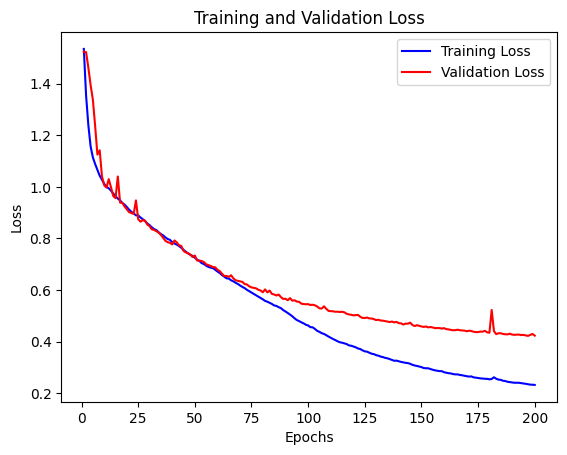

CPU times: user 27min 10s, sys: 1min 15s, total: 28min 25s
Wall time: 25min 52s


In [14]:
%%time
np.random.seed(42)

t_loss = []
v_loss = []
num_epochs = 200
lr = 1e-4

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = U_Net()
model = model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, verbose=True)
loss_fn = DiceBCELoss()

""" Training the model """
best_valid_loss = float("inf")

for epoch in range(num_epochs):
    
    train_loss = train(model, train_loader, optimizer, loss_fn, device)
    valid_loss = evaluate(model, valid_loader, loss_fn, device)
    scheduler.step(valid_loss)
    t_loss.append(train_loss)
    v_loss.append(valid_loss)

    """ Saving the model """
    if valid_loss < best_valid_loss:
        checkpoint_path = "/kaggle/working/model_checkpoint.pth"
        print(f"Valid loss improved from {best_valid_loss:2.4f} to {valid_loss:2.4f}. Saving checkpoint: {checkpoint_path}")
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), checkpoint_path)

    # Print train and validation loss after each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}]: Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}")

plt.plot(range(1, num_epochs + 1), t_loss, 'b', label='Training Loss')
plt.plot(range(1, num_epochs + 1), v_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# **Loading the Trained Model**

In [16]:
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = U_Net()
    model = model.to(device)
    model.load_state_dict(torch.load("/kaggle/input/model-200unet/model_checkpoint.pth", map_location=device))

<All keys matched successfully>

# **Evaluating Our Model**

In [17]:
# Initialize lists to store evaluation metrics
accuracy_list, f1_list, jaccard_list, recall_list, precision_list, dice_list = [], [], [], [], [], []

# Set model to evaluation mode
model.eval()

# Iterate through the test loader
for images, masks in test_loader:
    images = images.to(device)
    masks = masks > 0.5
    # Forward pass to obtain predicted masks
    with torch.no_grad():
        outputs = model(images)
        outputs = torch.sigmoid(outputs)
        outputs = outputs > 0.5
    
    # Convert predicted masks and ground truth masks to numpy arrays
    predicted_masks = outputs.cpu().numpy()
    true_masks = masks.numpy()
    
    
    # Iterate through each image in the batch
    for i in range(len(images)):
        # Store predicted and ground truth masks
        predicted_mask = predicted_masks[i][0]
        ground_truth_mask = true_masks[i][0]
        
        # Calculate evaluation metrics
        accuracy = accuracy_score(ground_truth_mask.flatten(), predicted_mask.flatten())
        f1 = f1_score(ground_truth_mask.flatten(), predicted_mask.flatten(), average='binary')
        jaccard = jaccard_score(ground_truth_mask.flatten(), predicted_mask.flatten(), average='binary') #intersection over union
        recall = recall_score(ground_truth_mask.flatten(), predicted_mask.flatten(), average='binary')
        precision = precision_score(ground_truth_mask.flatten(), predicted_mask.flatten(), average='binary')
        
        # Calculate dice coefficient (also known as F1 score)
        dice_coefficient = 2 * (np.sum(predicted_mask * ground_truth_mask)) / (np.sum(predicted_mask) + np.sum(ground_truth_mask))
        
        # Append evaluation metrics to lists
        accuracy_list.append(accuracy)
        f1_list.append(f1)
        jaccard_list.append(jaccard)
        recall_list.append(recall)
        precision_list.append(precision)
        dice_list.append(dice_coefficient)

accuracy_mean = np.mean(accuracy_list)
f1_mean = np.mean(f1_list)
jaccard_mean = np.mean(jaccard_list)
recall_mean = np.mean(recall_list)
precision_mean = np.mean(precision_list)
dice_mean = np.mean(dice_list)

print("Mean Accuracy: {:.2f}".format(accuracy_mean))
print("Mean F1 Score: {:.2f}".format(f1_mean))
print("Mean Jaccard Score: {:.2f}".format(jaccard_mean))
print("Mean Recall: {:.2f}".format(recall_mean))
print("Mean Precision: {:.2f}".format(precision_mean))
print("Mean Dice Coefficient: {:.2f}".format(dice_mean))

Mean Accuracy: 0.97
Mean F1 Score: 0.80
Mean Jaccard Score: 0.66
Mean Recall: 0.78
Mean Precision: 0.82
Mean Dice Coefficient: 0.80


# **Visualizing Model Predictions**

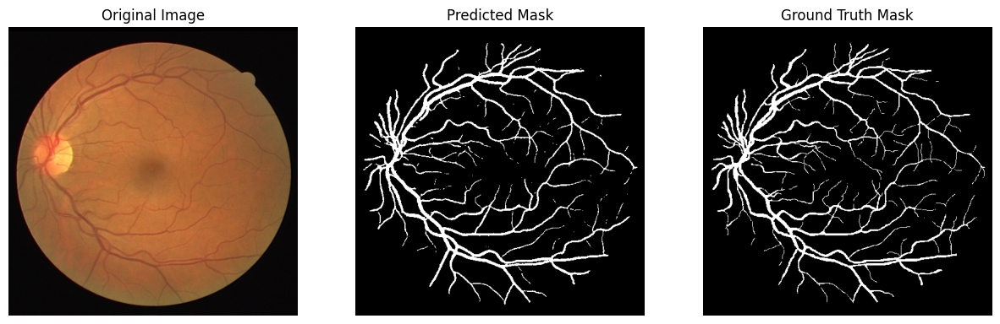

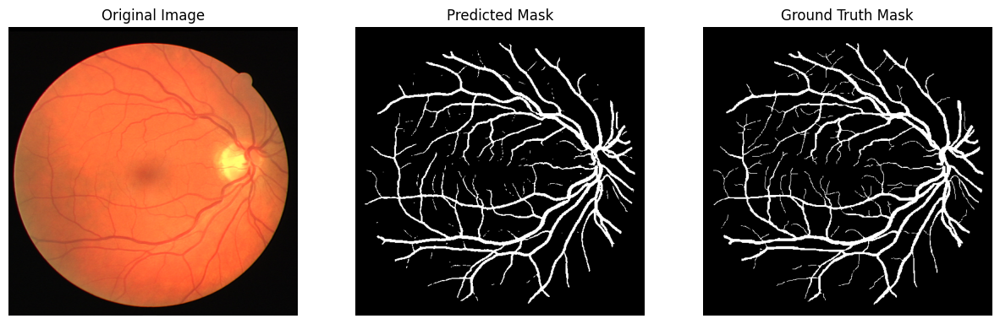

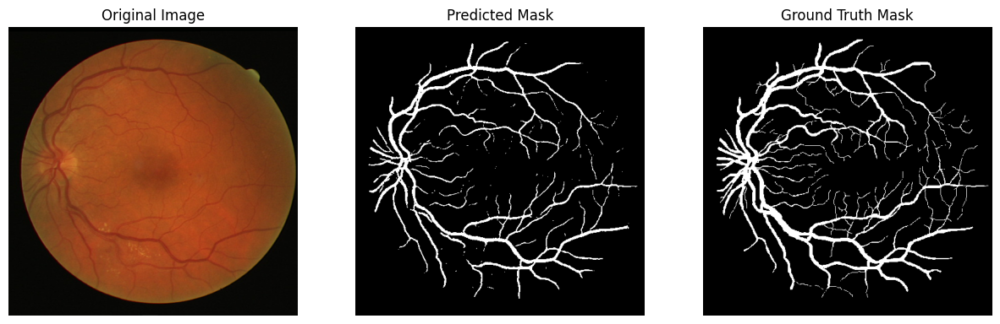

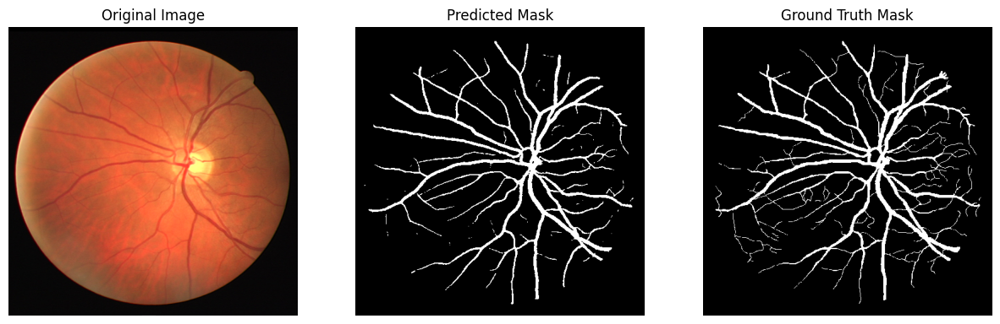

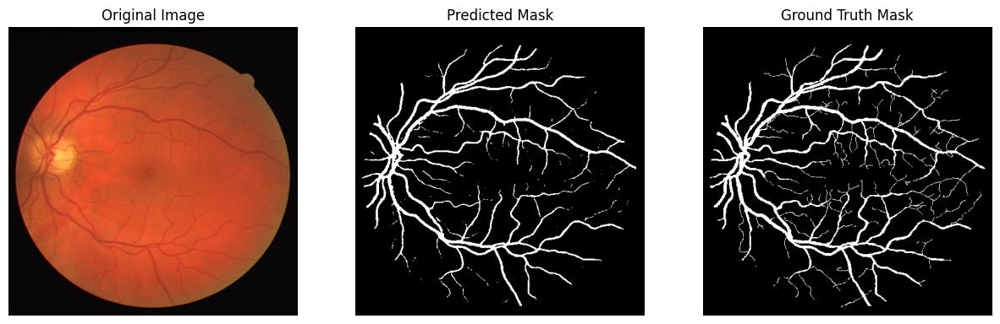

...

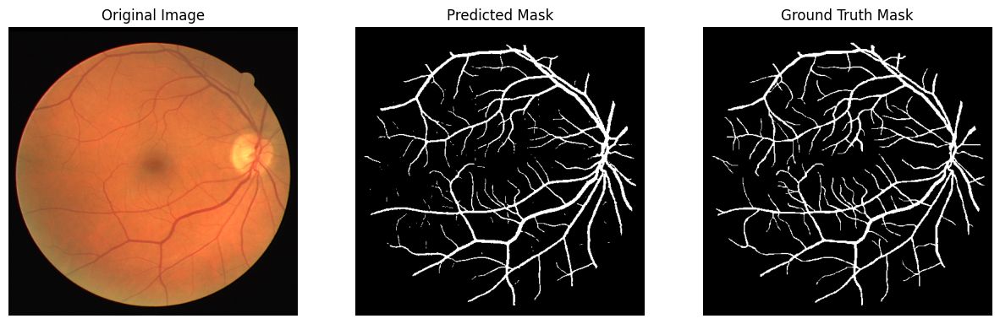

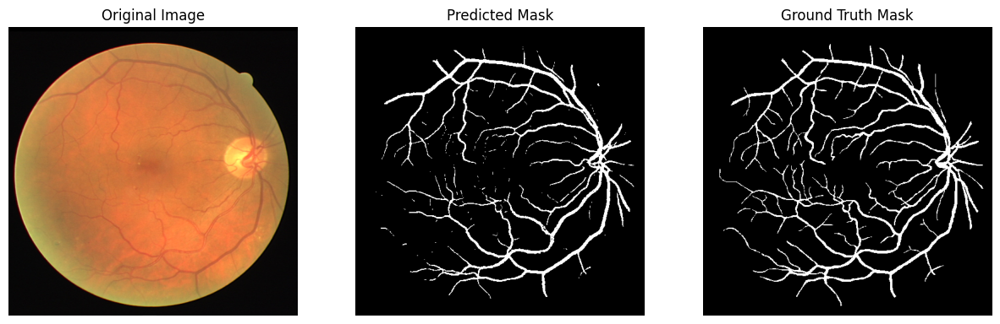

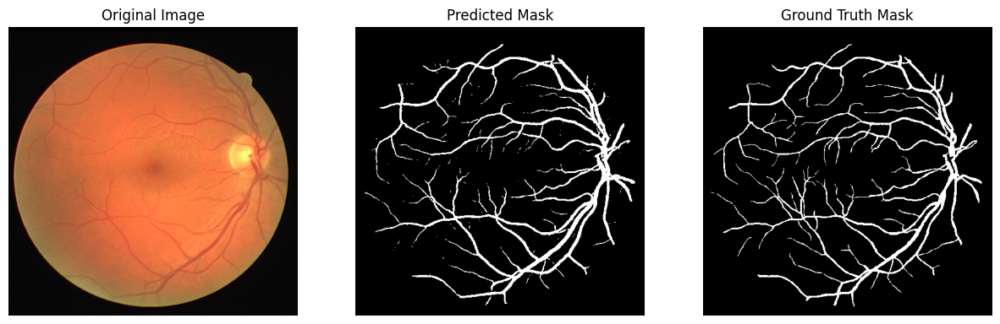

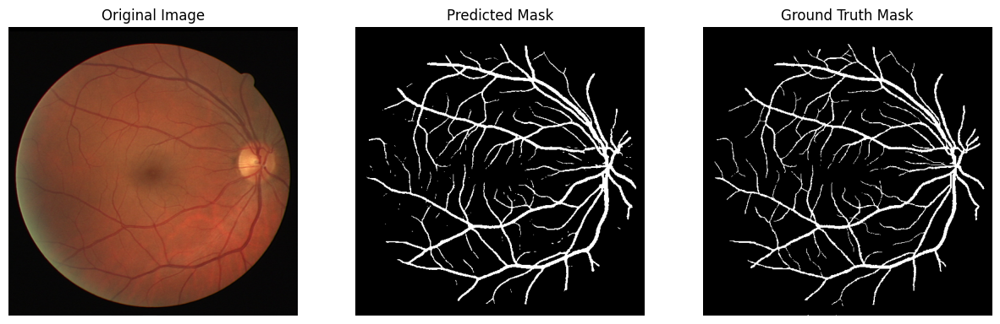

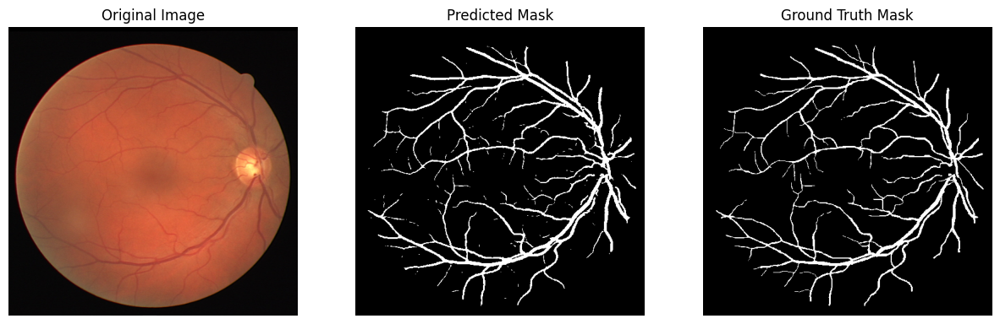

In [18]:
# Set model to evaluation mode
model.eval()

# Iterate through the test loader
for images, masks in test_loader:
    images = images.to(device)
    
    # Forward pass to obtain predicted masks
    with torch.no_grad():
        outputs = model(images)
        outputs = torch.sigmoid(outputs)
        outputs = outputs > 0.5
    
    # Convert predicted masks and ground truth masks to numpy arrays
    predicted_masks = outputs.cpu().numpy()
    masks = masks>0.5
    true_masks = masks.numpy()
    
    # Visualize original images, predicted masks, and ground truth masks
    for i in range(len(images)):
        plt.figure(figsize=(15, 5))
        
        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(images[i].permute(1, 2, 0).cpu())
        plt.title("Original Image")
        plt.axis('off')
        
        # Predicted mask
        plt.subplot(1, 3, 2)
        plt.imshow(predicted_masks[i][0], cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')
        
        # Ground truth mask
        plt.subplot(1, 3, 3)
        plt.imshow(true_masks[i][0], cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')
        
        plt.show()